In [44]:
import numpy as np
import imageio
import matplotlib.pyplot as plt
import glob
import scanpy as sc
import json
import os

##### Plotting our Visium data for visualization.

In [ ]:
visium_path = "/projects/2023_Spatial_Paper/data/visium/UCSD_133_VISIUM_SI_CHANG_DATA/cellranger_outputs/A1_D21_M4_SI_Proximal/outs/spatial"

In [45]:
h_and_e = imageio.imread(os.path.join(visium_path, "tissue_hires_image.png"))

/tmp/ipykernel_3073922/2341738736.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  h_and_e = imageio.imread("/projects/2023_Spatial_Paper/data/visium/UCSD_133_VISIUM_SI_CHANG_DATA/cellranger_outputs/A1_D21_M4_SI_Proximal/outs/spatial/tissue_hires_image.png")


In [46]:
visium_object = sc.read_h5ad("visium_with_axis_proximal.h5ad")

In [47]:
with open(os.path.join(visium_path, 'scalefactors_json.json')) as js:
    scale_factor = json.load(js)['tissue_hires_scalef']

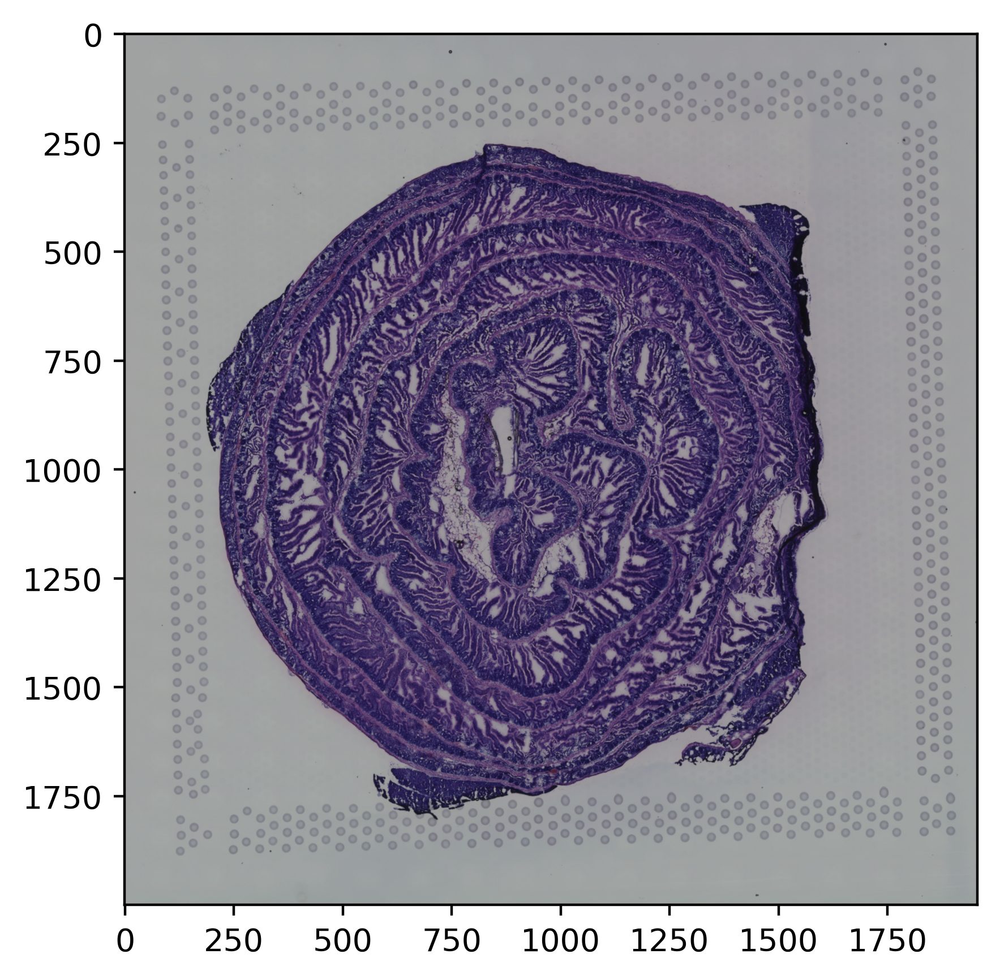

In [48]:
plt.figure(figsize=(5, 5), dpi=400)
plt.imshow(h_and_e)
plt.savefig('visium_moneyshot/visium_he.png')
plt.savefig('visium_moneyshot/visium_he.pdf')
plt.show()


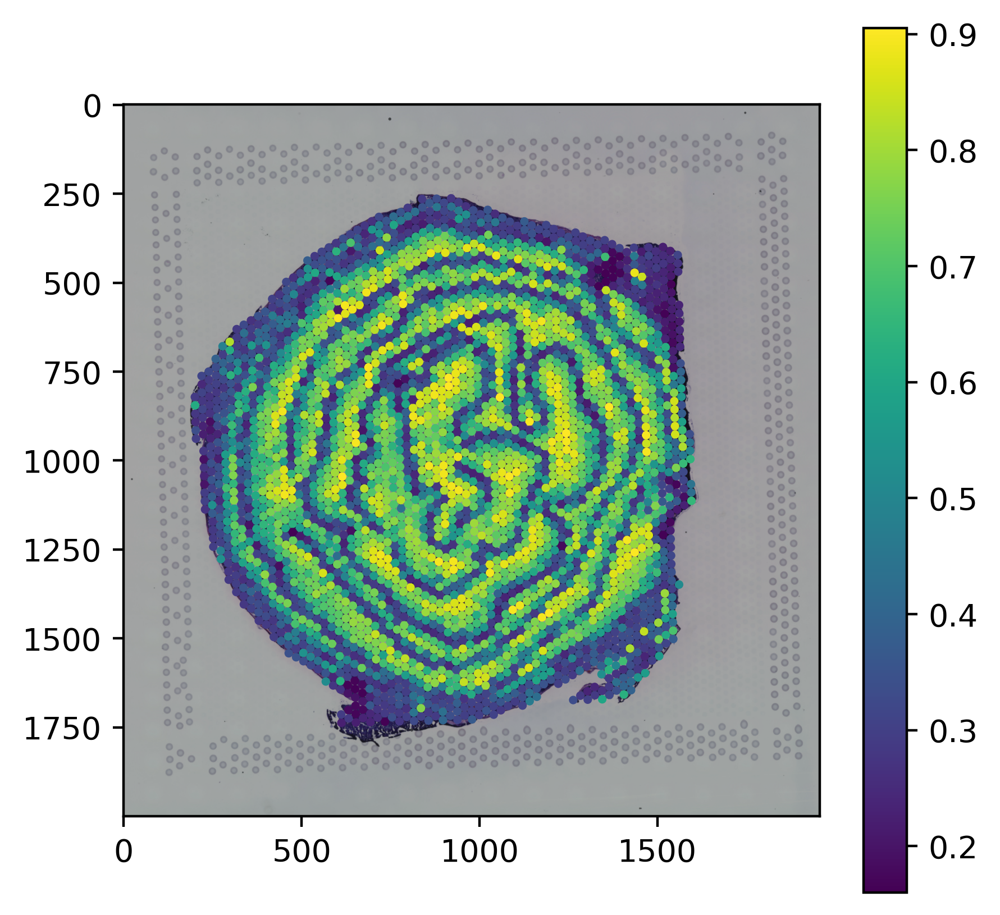

In [73]:
plt.figure(figsize=(5, 5), dpi=400)
plt.imshow(h_and_e)
plt.scatter(visium_object.obsm['X_spatial'][:, 1] * scale_factor, visium_object.obsm['X_spatial'][:, 0] * scale_factor, s=3, c=visium_object.obs['crypt_villi_axis'], cmap='viridis')
plt.colorbar()
plt.savefig('visium_moneyshot/visium_cv.png')
plt.savefig('visium_moneyshot/visium_cv.pdf')
plt.show()

In [58]:
sc.tl.pca(visium_object)

In [59]:
sc.pp.neighbors(visium_object)
sc.tl.umap(visium_object)

In [69]:
sc.tl.leiden(visium_object, resolution=0.5)

/home/amonell/mambaforge/envs/merscope_01/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


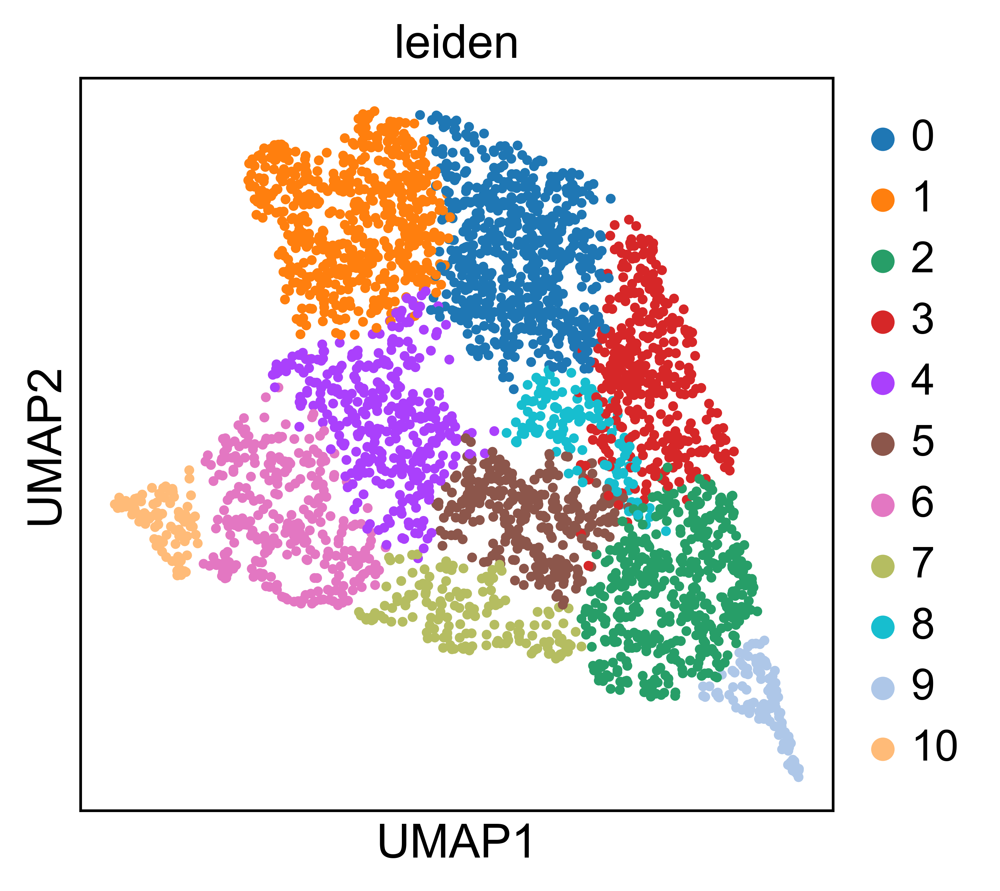

In [75]:
sc.set_figure_params(dpi=400)
fig = sc.pl.umap(visium_object, color='leiden', return_fig=True, show=False)
fig.savefig('visium_moneyshot/visium_umap_leiden.pdf')
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


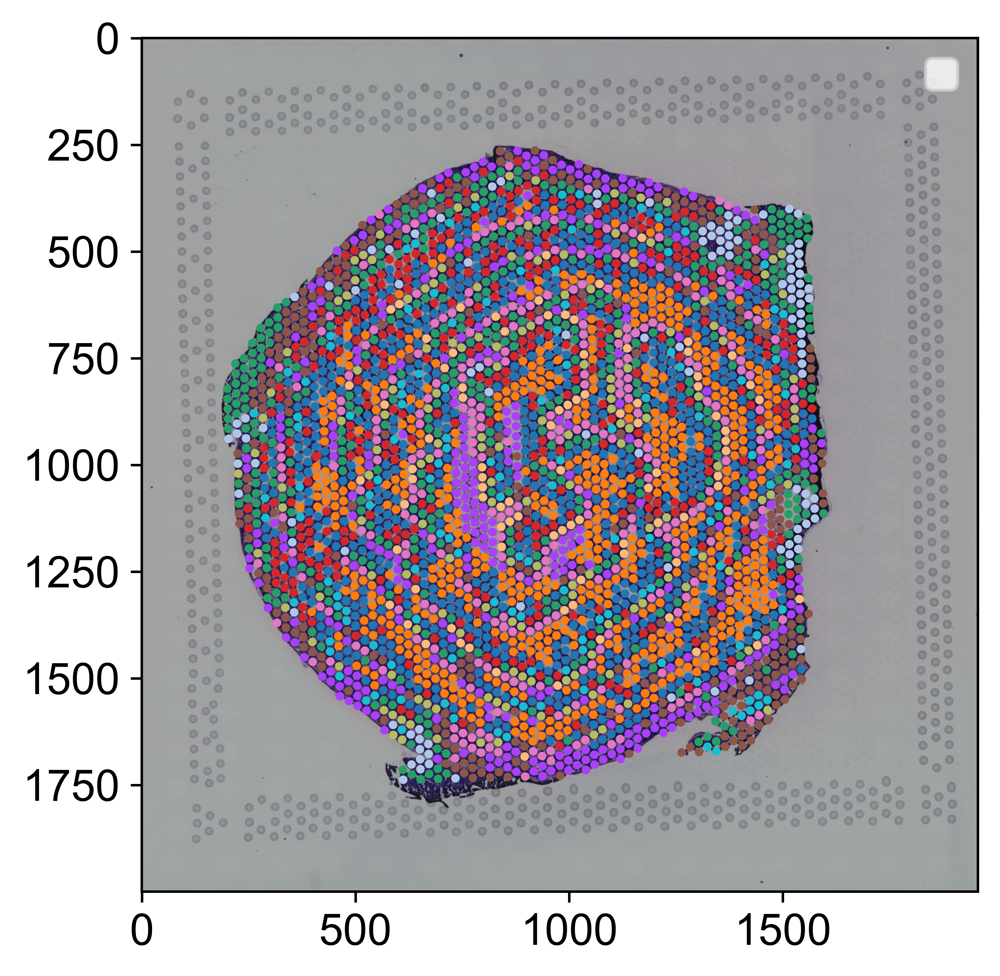

In [78]:
plt.figure(figsize=(5, 5), dpi=400)
plt.imshow(h_and_e)
plt.scatter(visium_object.obsm['X_spatial'][:, 1] * scale_factor, visium_object.obsm['X_spatial'][:, 0] * scale_factor, s=3, c=[visium_object.uns['leiden_colors'][j] for j in visium_object.obs['leiden'].astype(int)])
plt.grid(False)
plt.legend()
plt.savefig('visium_moneyshot/visium_leiden.png')
plt.savefig('visium_moneyshot/visium_leiden.pdf')
plt.show()